In [1]:
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.layers import (
    Dense, Flatten, Conv2D, Conv2DTranspose, Reshape, Input, LeakyReLU, Dropout, BatchNormalization, GaussianNoise
)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers.legacy import Adam
import tensorflow_addons as tfa

import matplotlib.pyplot as plt
import os
import requests
from tqdm import tqdm
from tensorflow.keras.losses import BinaryCrossentropy

# Suppress TensorFlow logs for cleaner output
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Print TensorFlow version and GPU availability
print("TensorFlow version:", tf.__version__)
print("Is GPU available:", tf.config.list_physical_devices('GPU'))

/Users/jelteoldenhof/Projects/master/1_deep_learning/ASS2/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/jelteoldenhof/Projects/master/1_deep_learning/ASS2/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/jelteoldenhof/Projects/master/1_deep_learning/ASS2/.venv/lib/python3.9/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other rep

TensorFlow version: 2.14.0
Is GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
def download_dataset(url, filepath):
    if not os.path.exists(filepath):
        print("Downloading dataset...")
        response = requests.get(url, stream=True)
        with open(filepath, "wb") as f:
            for data in response.iter_content(chunk_size=1024):
                f.write(data)
        print(f"Dataset downloaded to {filepath}")

def load_real_samples(filepath, image_size=(64, 64)):
    print("Loading and preprocessing dataset...")
    dataset = np.load(filepath)
    dataset = np.array([tf.image.resize(image, image_size).numpy() for image in dataset])
    dataset = dataset.astype("float32") / 255.0
    return dataset

# Load the Flowers dataset with a reduced image size
def load_flowers_dataset(image_size=(64, 64), batch_size=64):
    # Download and prepare the dataset
    (train_data, _), dataset_info = tfds.load(
        'tf_flowers',
        split=['train[:90%]', 'train[90%:]'],  # 90% training, 10% validation
        as_supervised=True,
        with_info=True
    )
    def preprocess(image, label):
        image = tf.image.resize(image, image_size)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
        return image, label
    
    train_data = train_data.map(preprocess).batch(batch_size, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
    return train_data

def load_augmented_flowers_dataset(image_size=(64, 64), batch_size=64):
    train_data = tfds.load('tf_flowers', split='train', as_supervised=True)

    def preprocess_and_augment(image, label):
        image = tf.image.resize(image, image_size)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
        image = tf.image.random_flip_left_right(image)
        image = tf.image.random_brightness(image, 0.1)
        image = tf.image.random_contrast(image, 0.8, 1.2)
        return image, image

    train_data = train_data.map(preprocess_and_augment, num_parallel_calls=tf.data.AUTOTUNE)
    train_data = train_data.batch(batch_size, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
    return train_data

def visualize_samples(data, n=5):
    plt.figure(figsize=(10, 10))
    for i, images in enumerate(data.take(1)):
        for j in range(n * n):
            plt.subplot(n, n, j + 1)
            plt.imshow(images[j].numpy())
            plt.axis('off')
    plt.show()

def visualize_images(images, title='', n=5):
    total_images = len(images)
    grid_size = min(n * n, total_images)
    plt.figure(figsize=(10, 10))
    for i in range(grid_size):
        plt.subplot(n, n, i + 1)
        plt.imshow(np.clip(images[i], 0.0, 1.0))
        plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.show()

def augment_data(dataset):
    data_augmentation = tf.keras.Sequential([
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
    ])
    return dataset.map(lambda x: (data_augmentation(x), x), num_parallel_calls=tf.data.AUTOTUNE)

In [3]:
# Build the encoder with more layers and filters
def build_encoder(input_shape, latent_dim, filters=128):
    inputs = Input(shape=input_shape)
    x = Conv2D(filters, (3, 3), strides=2, padding="same")(inputs)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(filters * 2, (3, 3), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(filters * 4, (3, 3), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    x = Flatten()(x)
    z_mean = Dense(latent_dim, name="z_mean")(x)
    z_log_var = Dense(latent_dim, name="z_log_var")(x)
    return Model(inputs, [z_mean, z_log_var], name="Encoder")

# Build the decoder with more layers and filters
def build_decoder(latent_dim, output_shape, filters=128):
    latent_inputs = Input(shape=(latent_dim,))
    x = Dense(8 * 8 * filters, activation="relu")(latent_inputs)
    x = Reshape((8, 8, filters))(x)
    
    x = GaussianNoise(0.05)(x)
    x = Conv2DTranspose(filters * 4, (3, 3), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    x = Conv2DTranspose(filters * 2, (3, 3), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    x = Conv2DTranspose(filters, (3, 3), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    x = Conv2DTranspose(output_shape[-1], (3, 3), padding="same", activation="sigmoid")(x)
    return Model(latent_inputs, x, name="Decoder")

In [4]:
# Sampling layer for the VAE
class Sampling(tf.keras.layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [5]:
# Build the VAE with KL loss weighting
def build_vae(input_shape, latent_dim, kl_weight=0.01, filters=128):
    encoder = build_encoder(input_shape, latent_dim, filters)
    decoder = build_decoder(latent_dim, input_shape, filters)
    
    z_mean, z_log_var = encoder.output
    z = Sampling()([z_mean, z_log_var])
    reconstructed = decoder(z)
    
    vae = Model(encoder.input, reconstructed, name="VAE")
    kl_loss = kl_weight * -0.5 * tf.reduce_mean(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
    vae.add_loss(kl_loss)
    vae.compile(optimizer=Adam(learning_rate=1e-5), loss="binary_crossentropy")
    return encoder, decoder, vae


def train_vae(vae, dataset, epochs=30, batch_size=32):
    early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-5)
    history = vae.fit(dataset, dataset, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping, reduce_lr])
    return history

In [6]:
def interpolate_images(decoder, latent_dim, steps=10):
    # Generate 2 diverse random points in the latent space
    z1 = np.random.normal(0, 1, (1, latent_dim))
    z2 = np.random.normal(0, 2, (1, latent_dim))

    # Create interpolated vectors between z1 and z2
    z_interp = np.linspace(z1, z2, steps)
    z_interp = z_interp.reshape((steps, latent_dim))

    # Decode the interpolated vectors into images and rescale to [0, 1]
    generated_images = decoder.predict(z_interp)
    generated_images = np.clip(generated_images, 0.0, 1.0)

    # Plot
    plt.figure(figsize=(20, 4))
    for i in range(steps):
        plt.subplot(1, steps, i + 1)
        plt.imshow(generated_images[i])
        plt.axis('off')
    plt.suptitle("Latent Space Interpolation", fontsize=16)
    plt.show()

## VAE model on Face Dataset

Loading and preprocessing dataset...


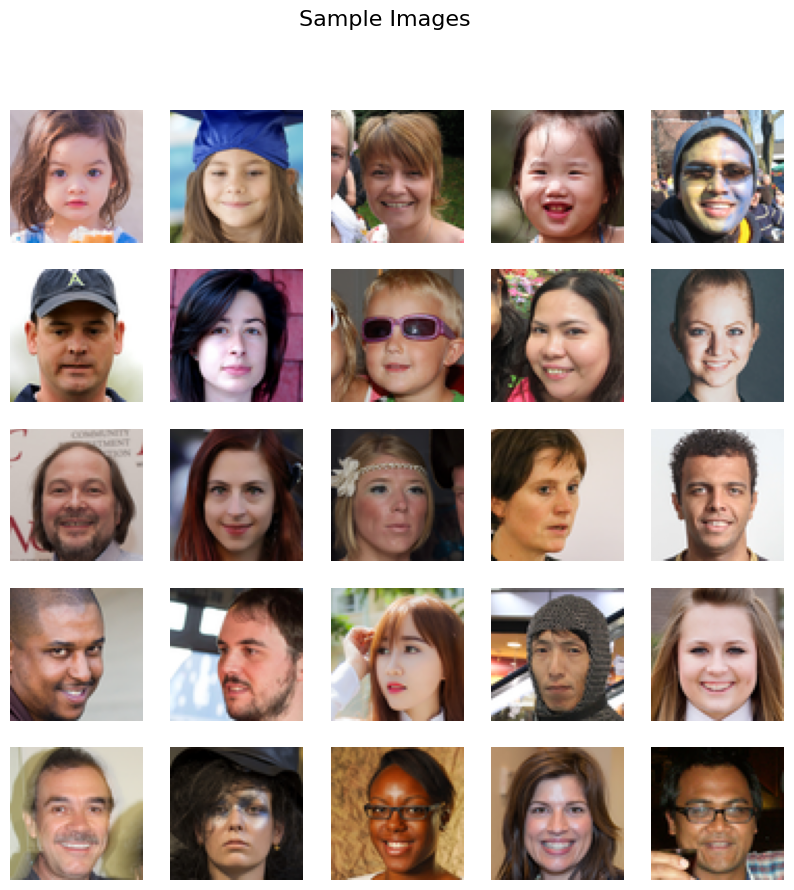

Epoch 1/25
640/640 [==============================] - 142s 220ms/step - loss: 0.6724
Epoch 2/25
640/640 [==============================] - 141s 220ms/step - loss: 0.6200
Epoch 3/25
640/640 [==============================] - 140s 219ms/step - loss: 0.6110
Epoch 4/25
640/640 [==============================] - 141s 220ms/step - loss: 0.6059
Epoch 5/25
640/640 [==============================] - 141s 221ms/step - loss: 0.6031
Epoch 6/25
640/640 [==============================] - 143s 223ms/step - loss: 0.6017
Epoch 7/25
640/640 [==============================] - 143s 223ms/step - loss: 0.6005
Epoch 8/25
640/640 [==============================] - 141s 221ms/step - loss: 0.5992
Epoch 9/25
640/640 [==============================] - 141s 220ms/step - loss: 0.5980
Epoch 10/25
640/640 [==============================] - 143s 224ms/step - loss: 0.5971
Epoch 11/25
640/640 [==============================] - 142s 222ms/step - loss: 0.5963
Epoch 12/25
640/640 [==============================] - 142s 222

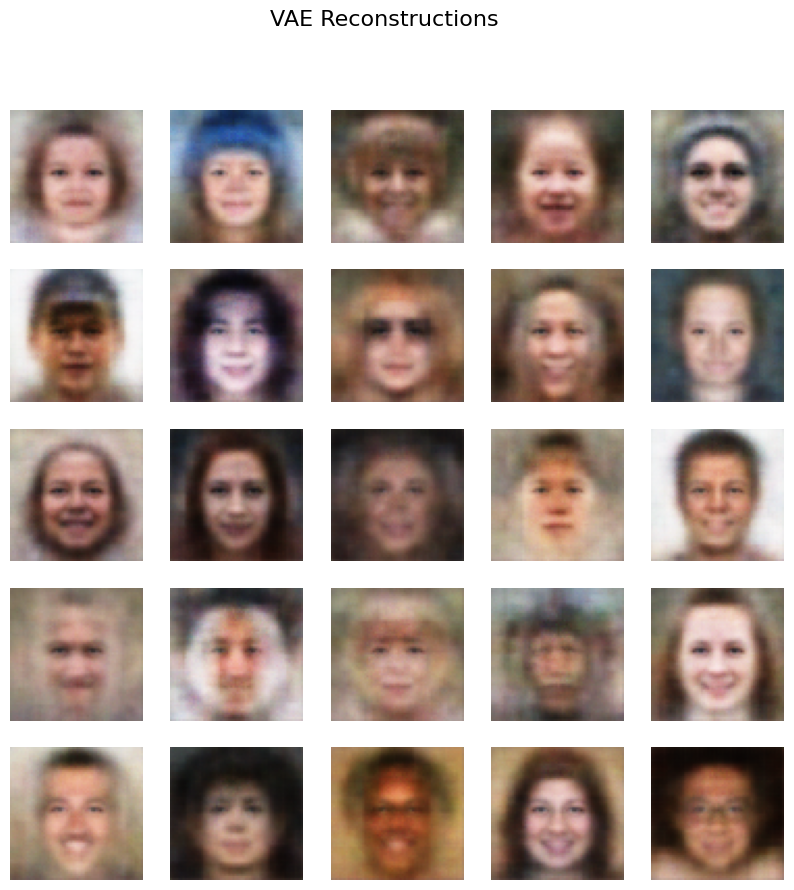

In [7]:
# Load Dataset
dataset_filepath = "face_dataset.npy"
dataset_url = "https://surfdrive.surf.nl/files/index.php/s/62Lnr1AtGe9b0v9/download"
# download_dataset(dataset_url, dataset_filepath)
dataset = load_real_samples(dataset_filepath, image_size=(64, 64))
visualize_images(dataset[:25], title="Sample Images", n=5)

# Apply data augmentation
tf_dataset = tf.data.Dataset.from_tensor_slices(dataset).batch(64).prefetch(tf.data.AUTOTUNE)
augmented_dataset = augment_data(tf_dataset)

# Build and train the VAE
latent_dim = 256
encoder, decoder, vae = build_vae(dataset.shape[1:], latent_dim, kl_weight=0.0005)

# Fit the model
history = vae.fit(augmented_dataset, epochs=25, batch_size=64)

# Visualize reconstructed images
reconstructed_images = vae.predict(dataset[:25])
visualize_images(reconstructed_images, title="VAE Reconstructions", n=5)

1/1 [==============================] - 0s 111ms/step


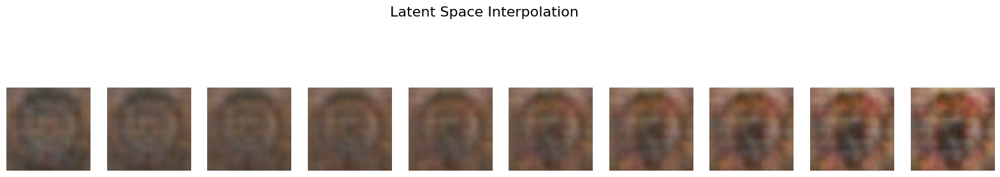

In [8]:
interpolate_images(decoder, latent_dim=latent_dim, steps=10)

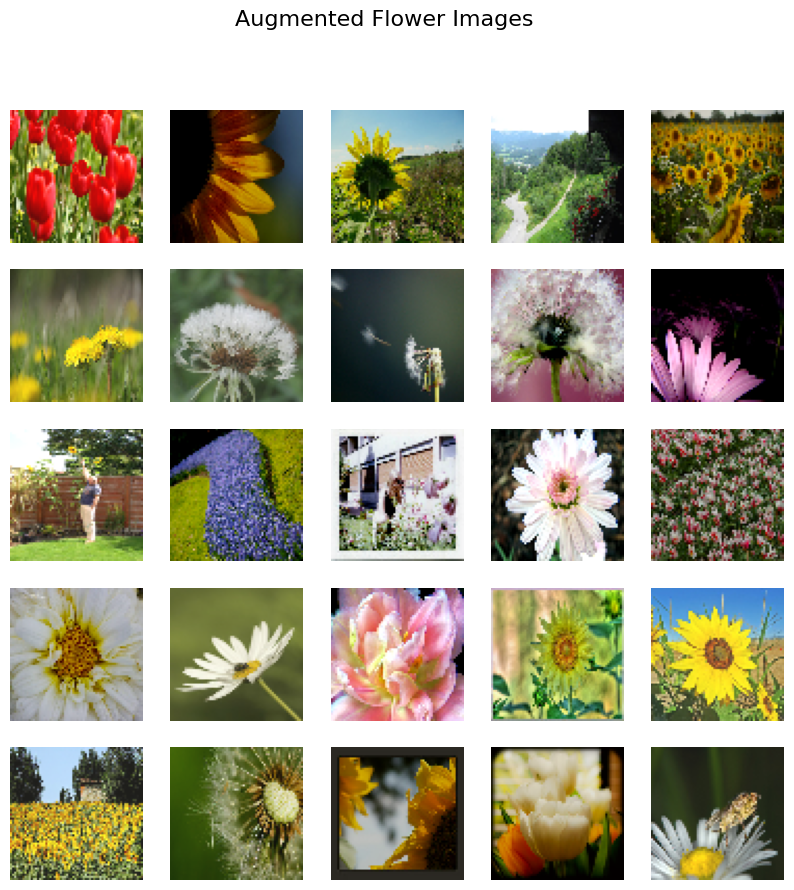

In [9]:
# Load the augmented flower dataset
train_dataset = load_augmented_flowers_dataset(image_size=(64, 64), batch_size=64)

# Visualize a sample of augmented images
for sample_images, _ in train_dataset.take(1):
    visualize_images(sample_images, title="Augmented Flower Images", n=5)

## VAE model on Flower Dataset

Epoch 1/60
57/57 [==============================] - 15s 243ms/step - loss: 0.7927
Epoch 2/60
57/57 [==============================] - 14s 239ms/step - loss: 0.7097
Epoch 3/60
57/57 [==============================] - 14s 249ms/step - loss: 0.6657
Epoch 4/60
57/57 [==============================] - 14s 242ms/step - loss: 0.6396
Epoch 5/60
57/57 [==============================] - 14s 243ms/step - loss: 0.6211
Epoch 6/60
57/57 [==============================] - 14s 241ms/step - loss: 0.6074
Epoch 7/60
57/57 [==============================] - 14s 240ms/step - loss: 0.5932
Epoch 8/60
57/57 [==============================] - 14s 249ms/step - loss: 0.5870
Epoch 9/60
57/57 [==============================] - 14s 242ms/step - loss: 0.5809
Epoch 10/60
57/57 [==============================] - 14s 245ms/step - loss: 0.5759
Epoch 11/60
57/57 [==============================] - 13s 237ms/step - loss: 0.5687
Epoch 12/60
57/57 [==============================] - 14s 237ms/step - loss: 0.5653
Epoch 13/60
5

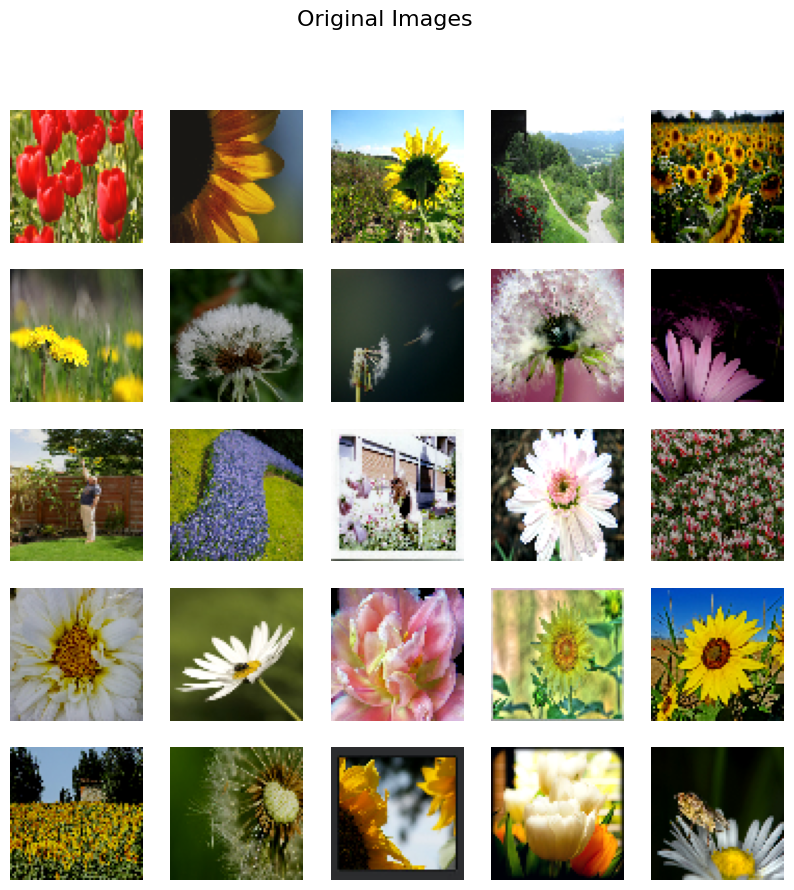

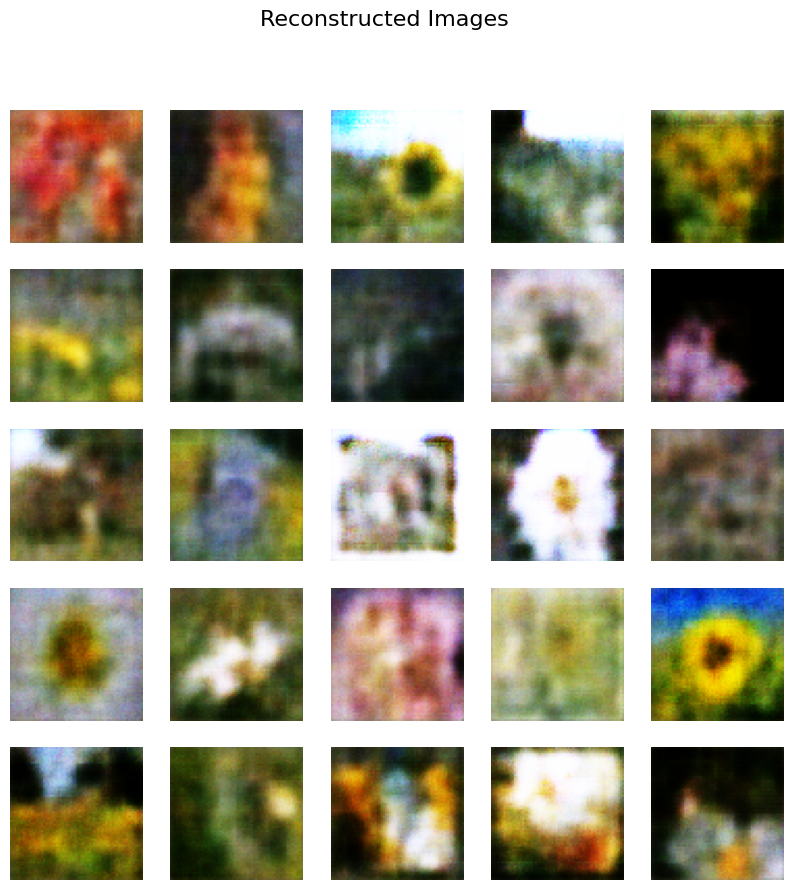

In [10]:
# Build and train the VAE
latent_dim = 512
encoder, decoder, vae = build_vae((64, 64, 3), latent_dim, kl_weight=0.0005)

# Train the VAE
history = vae.fit(train_dataset, epochs=60)

# Visualize reconstructed images
sample_images, _ = next(iter(train_dataset))
reconstructed_images = vae.predict(sample_images)

visualize_images(sample_images.numpy(), title="Original Images", n=5)
visualize_images(reconstructed_images, title="Reconstructed Images", n=5)

1/1 [==============================] - 0s 106ms/step


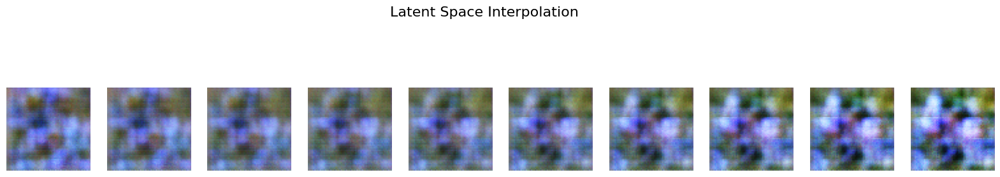

In [11]:
# Call the function with your decoder and latent dimension
interpolate_images(decoder, latent_dim=latent_dim, steps=10)

In [12]:
# GAN Functions
def build_generator(latent_dim, output_shape, filters=128):
    latent_inputs = Input(shape=(latent_dim,))
    x = Dense(8 * 8 * filters, activation="relu")(latent_inputs)
    x = Reshape((8, 8, filters))(x)

    # Upsampling
    x = Conv2DTranspose(filters, (4, 4), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)

    # Upsampling
    x = Conv2DTranspose(filters // 2, (4, 4), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)

    # Upsampling to 64x64
    x = Conv2DTranspose(filters // 4, (4, 4), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)

    # Output Layer
    x = Conv2DTranspose(output_shape[-1], (3, 3), padding="same", activation="tanh")(x)

    return Model(latent_inputs, x, name="Generator")

def build_discriminator(input_shape, filters=64):
    inputs = Input(shape=input_shape)
    x = Conv2D(filters, (4, 4), strides=2, padding="same")(inputs)
    x = LeakyReLU(0.2)(x)
    x = Dropout(0.3)(x)

    x = Conv2D(filters * 2, (4, 4), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = Dropout(0.3)(x)

    x = Flatten()(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs, name="Discriminator")

def build_gan(generator, discriminator, learning_rate=1e-4):
    discriminator.trainable = False
    gan_input = Input(shape=generator.input_shape[1:])
    gan_output = discriminator(generator(gan_input))
    gan = Model(gan_input, gan_output)
    gan.compile(optimizer=Adam(learning_rate), loss="binary_crossentropy")
    return gan

def train_gan(generator, discriminator, gan, dataset, epochs, batch_size, latent_dim):
    half_batch = batch_size // 2
    smooth_real_labels = 0.95
    real_labels = np.ones((half_batch, 1)) * smooth_real_labels
    fake_labels = np.zeros((half_batch, 1))

    for epoch in range(epochs):
        for i in range(len(dataset) // batch_size):
            
            # Train discriminator
            idx = np.random.randint(0, len(dataset), half_batch)
            real_images = dataset[idx]
            noise = np.random.normal(0, 1, (half_batch, latent_dim))
            fake_images = generator.predict(noise)

            # Train discriminator with real and fake images
            d_loss_real = discriminator.train_on_batch(real_images, real_labels)
            d_loss_fake = discriminator.train_on_batch(fake_images, fake_labels)

            # Train generator
            noise = np.random.normal(0, 1, (batch_size, latent_dim))
            g_loss = gan.train_on_batch(noise, np.ones((batch_size, 1)) * smooth_real_labels)

        print(f"Epoch {epoch+1}/{epochs} | D Loss: {d_loss_real + d_loss_fake:.4f} | G Loss: {g_loss:.4f}")

        # learning rates for stability
        if epoch % 5 == 0 and epoch != 0:
            lr = gan.optimizer.learning_rate.numpy() * 0.9
            gan.optimizer.learning_rate.assign(lr)
            discriminator.optimizer.learning_rate.assign(lr)
            print(f"Learning rate decayed to: {lr:.6f}")

In [13]:
def visualize_generated_images(generator, latent_dim, n=5):
    noise = np.random.normal(0, 1, (n * n, latent_dim))
    generated_images = generator.predict(noise)
    
    # Rescale images [-1, 1] to [0, 1]
    generated_images = (generated_images + 1) / 2.0

    plt.figure(figsize=(10, 10))
    for i in range(n * n):
        plt.subplot(n, n, i + 1)
        plt.imshow(np.clip(generated_images[i], 0.0, 1.0))
        plt.axis('off')
    plt.suptitle("Generated Images", fontsize=16)
    plt.show()

In [14]:
# Load Dataset
dataset_filepath = "face_dataset.npy"
# dataset_url = "https://surfdrive.surf.nl/files/index.php/s/62Lnr1AtGe9b0v9/download"
# download_dataset(dataset_url, dataset_filepath)
dataset = load_real_samples(dataset_filepath, image_size=(64, 64))

Loading and preprocessing dataset...


## GAN model on Face Dataset

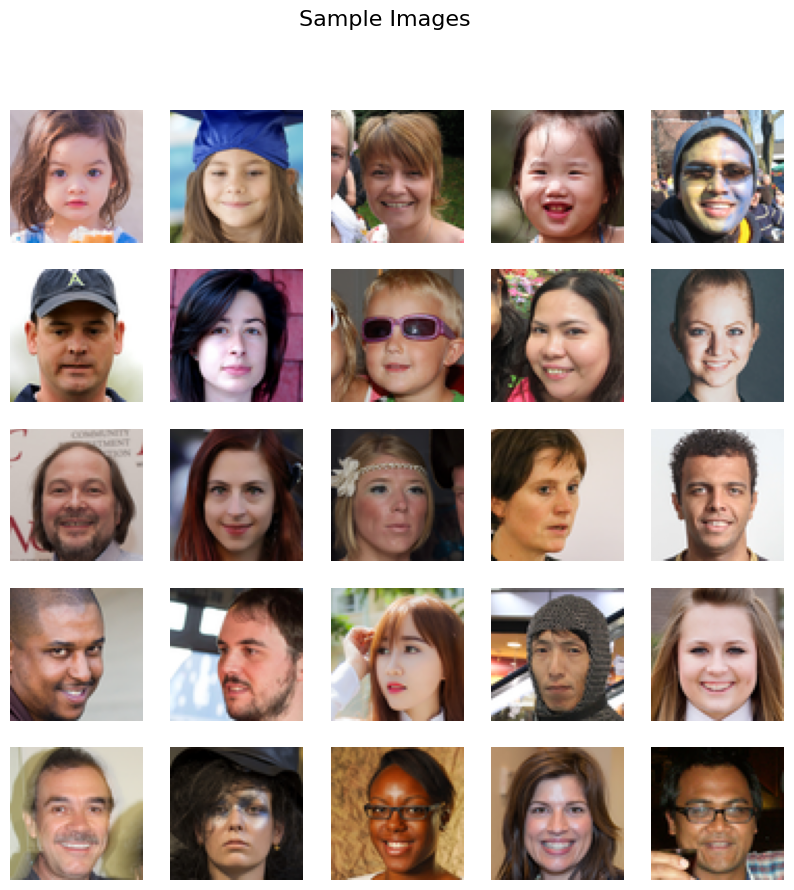

1/1 [==============================] - 0s 9ms/step
Epoch 1/30 | D Loss: 0.1998 | G Loss: 6.5023
1/1 [==============================] - 0s 8ms/step
Epoch 2/30 | D Loss: 0.7527 | G Loss: 2.1369
1/1 [==============================] - 0s 8ms/step
Epoch 3/30 | D Loss: 1.3363 | G Loss: 0.8121
1/1 [==============================] - 0s 8ms/step
Epoch 4/30 | D Loss: 1.1973 | G Loss: 0.9344
1/1 [==============================] - 0s 8ms/step
Epoch 5/30 | D Loss: 1.4112 | G Loss: 0.6254
1/1 [==============================] - 0s 8ms/step
Epoch 6/30 | D Loss: 0.8711 | G Loss: 1.2802
Learning rate decayed to: 0.000090
1/1 [==============================] - 0s 12ms/step
Epoch 7/30 | D Loss: 1.2505 | G Loss: 0.7620
1/1 [==============================] - 0s 9ms/step
Epoch 8/30 | D Loss: 1.2743 | G Loss: 1.2289
1/1 [==============================] - 0s 8ms/step
Epoch 9/30 | D Loss: 1.2345 | G Loss: 0.5843
1/1 [==============================] - 0s 8ms/step
Epoch 10/30 | D Loss: 0.6755 | G Loss: 0.4644
1/1

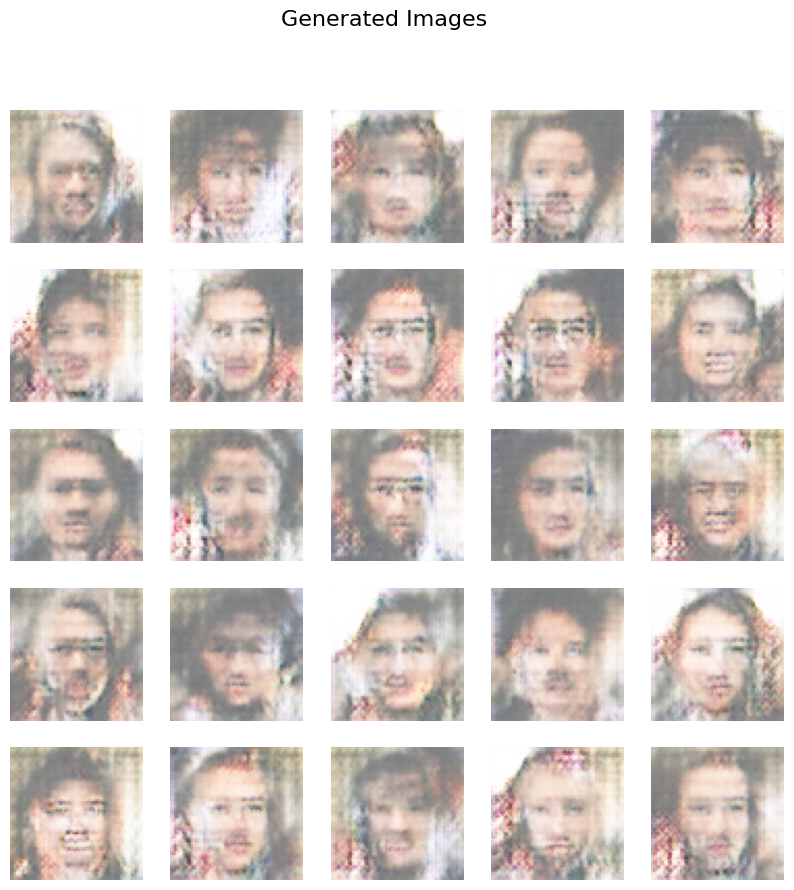

In [15]:
visualize_images(dataset[:25], title="Sample Images", n=5)

# Build generator and discriminator
latent_dim = 128
generator = build_generator(latent_dim, dataset.shape[1:])
discriminator = build_discriminator(dataset.shape[1:])

# Build and compile GAN
discriminator.compile(optimizer=Adam(1e-4), loss="binary_crossentropy")
gan = build_gan(generator, discriminator)

# Train the GAN
train_gan(generator, discriminator, gan, dataset, epochs=30, batch_size=64, latent_dim=latent_dim)

# Visualize generated images
visualize_generated_images(generator, latent_dim, n=5)

1/1 [==============================] - 0s 70ms/step


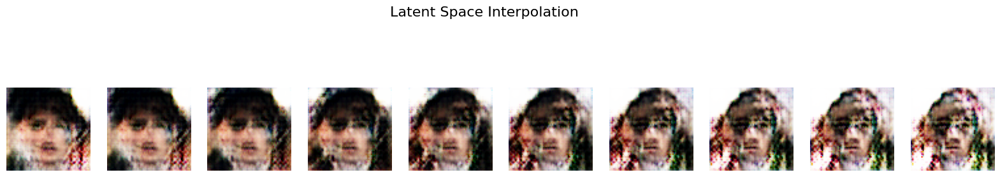

In [19]:
interpolate_images(generator, latent_dim=latent_dim, steps=10)

## GAN model on Flower Dataset

In [16]:
# Load Flower dataset
flower_dataset = load_flowers_dataset(image_size=(64, 64))

# Build and compile GAN for flower dataset
generator_flower = build_generator(latent_dim, (64, 64, 3))
discriminator_flower = build_discriminator((64, 64, 3))
discriminator_flower.compile(optimizer=Adam(1e-5), loss="binary_crossentropy")
gan_flower = build_gan(generator_flower, discriminator_flower, learning_rate=1e-5)

# Convert Flower dataset to numpy array for GAN training
flower_images = np.vstack([batch.numpy() for batch, _ in flower_dataset])

# Train GAN
train_gan(generator_flower, discriminator_flower, gan_flower, flower_images, epochs=100, batch_size=64, latent_dim=latent_dim)

1/1 [==============================] - 0s 7ms/step
Epoch 1/100 | D Loss: 0.9924 | G Loss: 0.5347
1/1 [==============================] - 0s 8ms/step
Epoch 2/100 | D Loss: 0.5360 | G Loss: 0.7628
1/1 [==============================] - 0s 8ms/step
Epoch 3/100 | D Loss: 0.2766 | G Loss: 1.0398
1/1 [==============================] - 0s 8ms/step
Epoch 4/100 | D Loss: 0.2284 | G Loss: 0.9888
1/1 [==============================] - 0s 8ms/step
Epoch 5/100 | D Loss: 0.2181 | G Loss: 0.8313
1/1 [==============================] - 0s 7ms/step
Epoch 6/100 | D Loss: 0.2219 | G Loss: 0.7299
Learning rate decayed to: 0.000009
1/1 [==============================] - 0s 9ms/step
Epoch 7/100 | D Loss: 0.2355 | G Loss: 0.6383
1/1 [==============================] - 0s 9ms/step
Epoch 8/100 | D Loss: 0.2172 | G Loss: 0.6052
1/1 [==============================] - 0s 8ms/step
Epoch 9/100 | D Loss: 0.2465 | G Loss: 0.6004
1/1 [==============================] - 0s 9ms/step
Epoch 10/100 | D Loss: 0.2269 | G Loss: 0

1/1 [==============================] - 0s 110ms/step


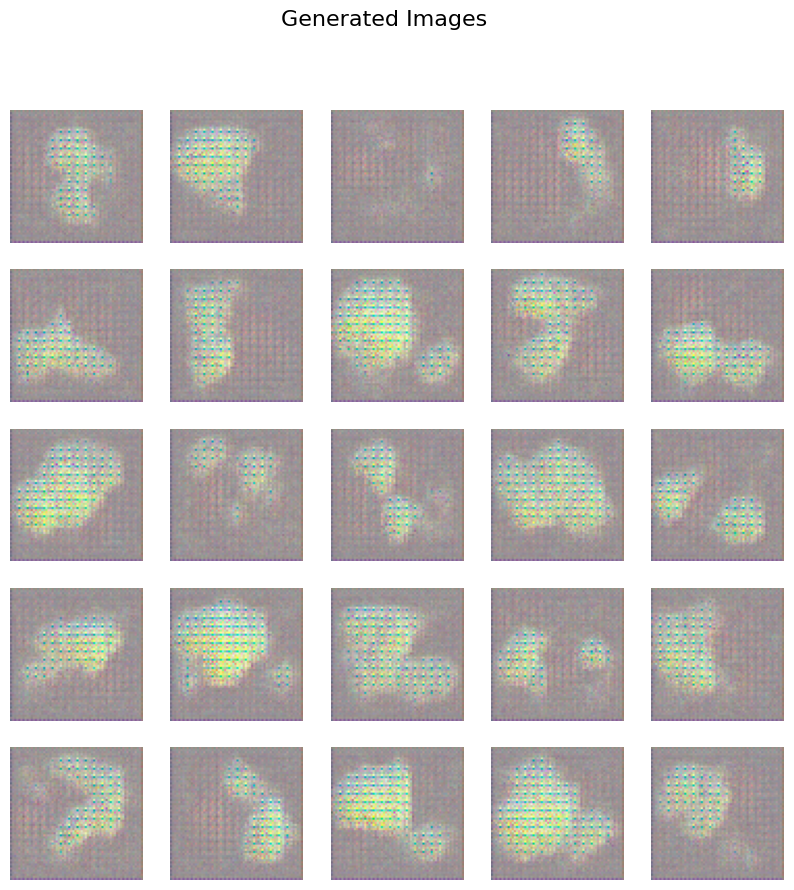

In [17]:
visualize_generated_images(generator_flower, latent_dim, n=5)

1/1 [==============================] - 0s 55ms/step


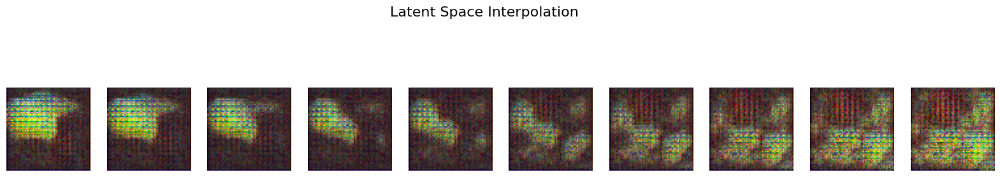

In [18]:
# Interpolate images
interpolate_images(generator_flower, latent_dim=latent_dim, steps=10)